<a href="https://colab.research.google.com/github/cagBRT/Diffusers/blob/main/Diffusers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Diffusers <br>
This notebook demostrates usage of:<br>
>## Latent Diffusion Model <br>
>## Stable Diffusion Model

App doesn't work
https://huggingface.co/spaces/CompVis/text2img-latent-diffusion


In [2]:
# Clone the entire repo.
!git clone -s https://github.com/cagBRT/Diffusers.git cloned-repo
%cd cloned-repo

fatal: destination path 'cloned-repo' already exists and is not an empty directory.
/content/cloned-repo


In [9]:
from IPython.display import Image

In [4]:
!pip3 install transformers

In [5]:
!pip install accelerate

In [6]:
#!pip uninstall diffusers
!pip install diffusers

# Import the libraries

In [7]:
import transformers

In [8]:
import torch

# Install the diffusers library

In [9]:
from transformers import pipeline
from transformers import AutoTokenizer, TFAutoModelForSequenceClassification
import tensorflow as tf
from transformers import AutoTokenizer, TFAutoModelForQuestionAnswering
from pprint import pprint
from transformers import AutoModelForMaskedLM, AutoTokenizer
import torch
from transformers import TFAutoModelForMaskedLM, AutoTokenizer
from transformers import AutoModelForCausalLM, AutoTokenizer, top_k_top_p_filtering
from torch import nn
from accelerate import Accelerator
from diffusers import DiffusionPipeline

In [10]:
from diffusers import StableDiffusionPipeline, LMSDiscreteScheduler
from diffusers import StableDiffusionPipeline

# High-Resolution Image Synthesis with Latent Diffusion Models (LDM)<br>


CompVis/ldm-text2im-large-256 is a High-Resolution Image Synthesis with Latent Diffusion Models (LDM)

It is atext-to-image model

In [11]:
model_id = "CompVis/ldm-text2im-large-256"

The DiffusionPipeline class is the simplest and most generic way to load any diffusion model from the Hub. <br>

The DiffusionPipeline.from_pretrained() method detects the correct pipeline class from the checkpoint, downloads and caches all the required configuration and weight files, and returns a pipeline instance ready for inference.

In [12]:
# load text input to diffusion pipeline
ldm = DiffusionPipeline.from_pretrained(model_id)

bert/model.safetensors not found


Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

The config attributes {'timestep_values': None} were passed to DDIMScheduler, but are not expected and will be ignored. Please verify your scheduler_config.json configuration file.


**Note that text-to-image models are known to sometimes produce harmful content.**

You can change the number of inference steps using the num_inference_steps argument.<br><br>

**In general, results are better the more steps you use, however the more steps, the longer the generation takes**. <br>
Diffusion models work quite well with a relatively small number of steps, the default number of inference steps of 50. <br>
If you want faster results you can use a smaller number. <br>
If you want potentially higher quality results, you can use larger numbers.

**Schedulers**<br>
Schedulers in the library take in the output of a trained model, a sample which the diffusion process is iterating on, and a timestep to return a denoised sample.



In [13]:
# run inference (sample random noise and denoise)
prompt = "A painting of a squirrel eating a banana"
images = ldm([prompt], num_inference_steps=50, eta=.3, guidance_scale=6)

  0%|          | 0/50 [00:00<?, ?it/s]

If at some point you get a black image, it may be because the content filter built inside the model might have detected an NSFW (not safe for work) result. If you believe this shouldn't be the case, try tweaking your prompt or using a different seed. In fact, the model predictions include information about whether NSFW was detected for a particular result

Generated images of the prompt<br>
>"A painting of a squirrel eating a banana"

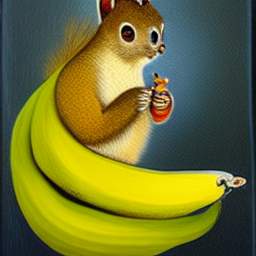

In [14]:
images.images[0]

The images below are from previous runs of the model with the same prompt

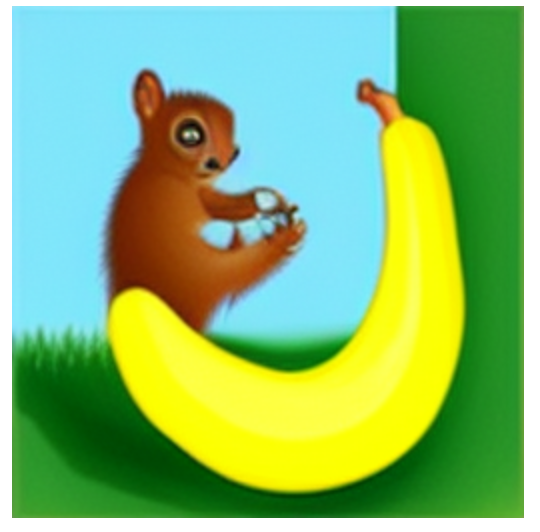

In [15]:
Image("squirrel1.png" , width=300)

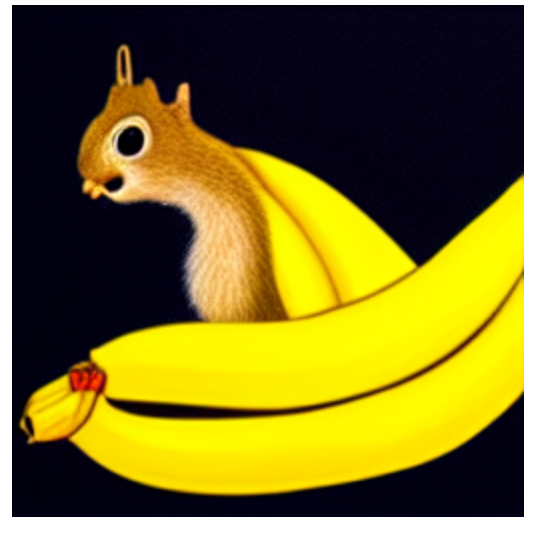

In [16]:
Image("squirrel2.png" , width=300)

Generated images of the prompt<br>
>"A photo of a squirrel eating a banana"

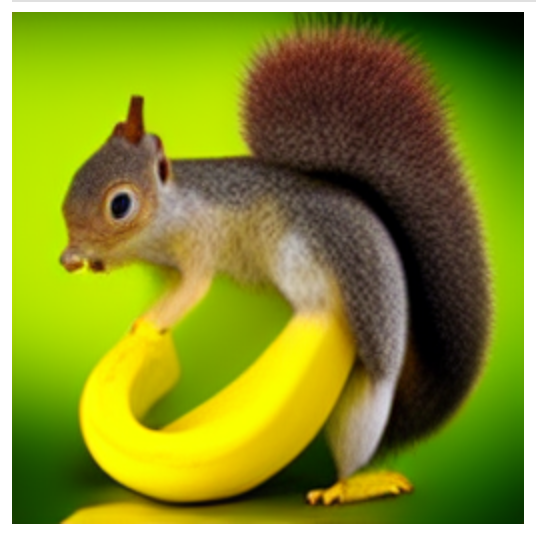

In [17]:
Image("squirrel3.png" , width=300)

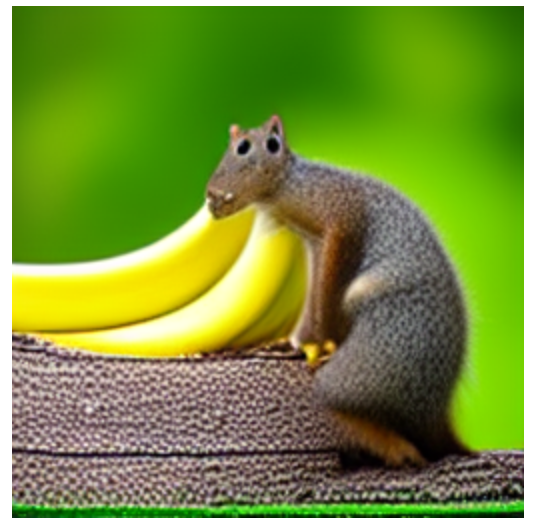

In [18]:
Image("squirrel4.png" , width=300)

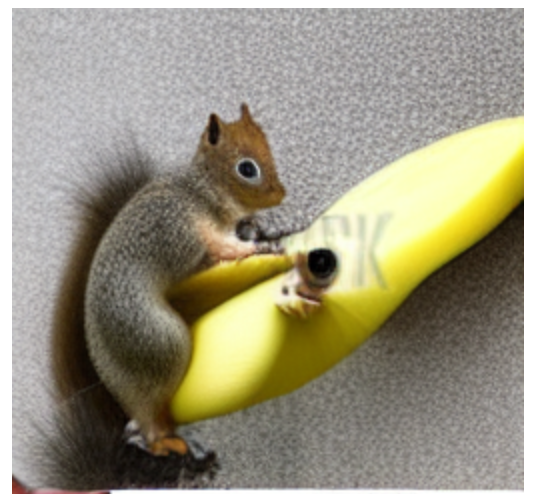

In [19]:
Image("squirrel5.png" , width=300)



---



---



# Stable Diffusion<br>
Stable Diffusion is a text-to-image latent diffusion model created by the researchers and engineers from CompVis, Stability AI and LAION. <br>
It is trained on 512x512 images from a subset of the LAION-5B database. <br>

LAION-5B is the largest, freely accessible multi-modal dataset that currently exists.

In [2]:
#!pip install diffusers==0.10.2 transformers scipy ftfy accelerate
from diffusers import LMSDiscreteScheduler
from diffusers import StableDiffusionPipeline

The Stable Diffusion model can be run in inference with just a couple of lines using the StableDiffusionPipeline pipeline. The pipeline sets up everything you need to generate images from text with a simple from_pretrained function call.

This next example will take a while to run because it has 1000 timesteps. <br>
This gives a photorealistic image, but is time consuming.

In [3]:
model_id = "CompVis/stable-diffusion-v1-3"
scheduler = LMSDiscreteScheduler(beta_start=0.00085, beta_end=0.012,
                                 beta_schedule="scaled_linear", num_train_timesteps=1000)
pipe = StableDiffusionPipeline.from_pretrained(model_id, scheduler=scheduler)
#pipe = pipe.to("cuda")

vae/diffusion_pytorch_model.safetensors not found


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["bos_token_id"]` will be overriden.
`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["eos_token_id"]` will be overriden.
/usr/local/lib/python3.10/dist-packages/diffusers/pipelines/stable_diffusion/pipeline_stable_diffusion.py:128: FutureWarning: The configuration file of this scheduler: LMSDiscreteScheduler {
  "_class_name": "LMSDiscreteScheduler",
  "_diffusers_version": "0.20.2",
  "beta_end": 0.012,
  "beta_schedule": "scaled_linear",
  "beta_start": 0.00085,
  "num_train_timesteps": 1000,
  "prediction_type": "epsilon",
  "steps_offset": 0,
  "timestep_spacing": "linspace",
  "trained_betas": null,
  "use_karras_sigmas": false
}
 is outdated. `steps_offset` should be set to 1 instead of 

The code will run much faster with a GPU, but as this is the free version of CoLab, so the GPU may not be available.

In [4]:
num_images=3
prompt = ["a photo of an astronaut riding a horse on mars"]#*num_images
#with autocast("cuda"):

In [5]:
images = pipe(prompt, guidance_scale=7.5)[0]

  0%|          | 0/50 [00:00<?, ?it/s]

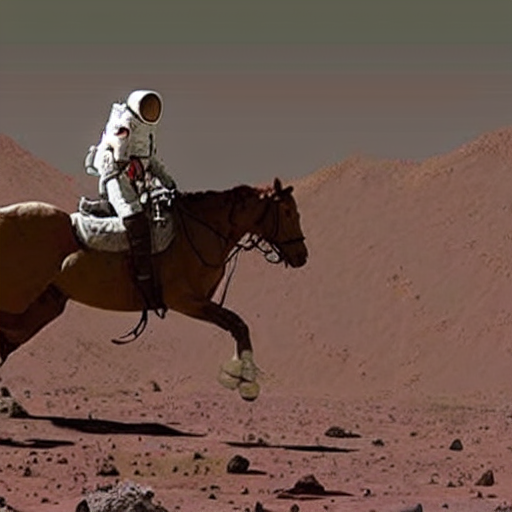

In [6]:
images[0]

Geenrated images of the prompt:<br>
>"a photo of an astronaut riding a horse on mars"

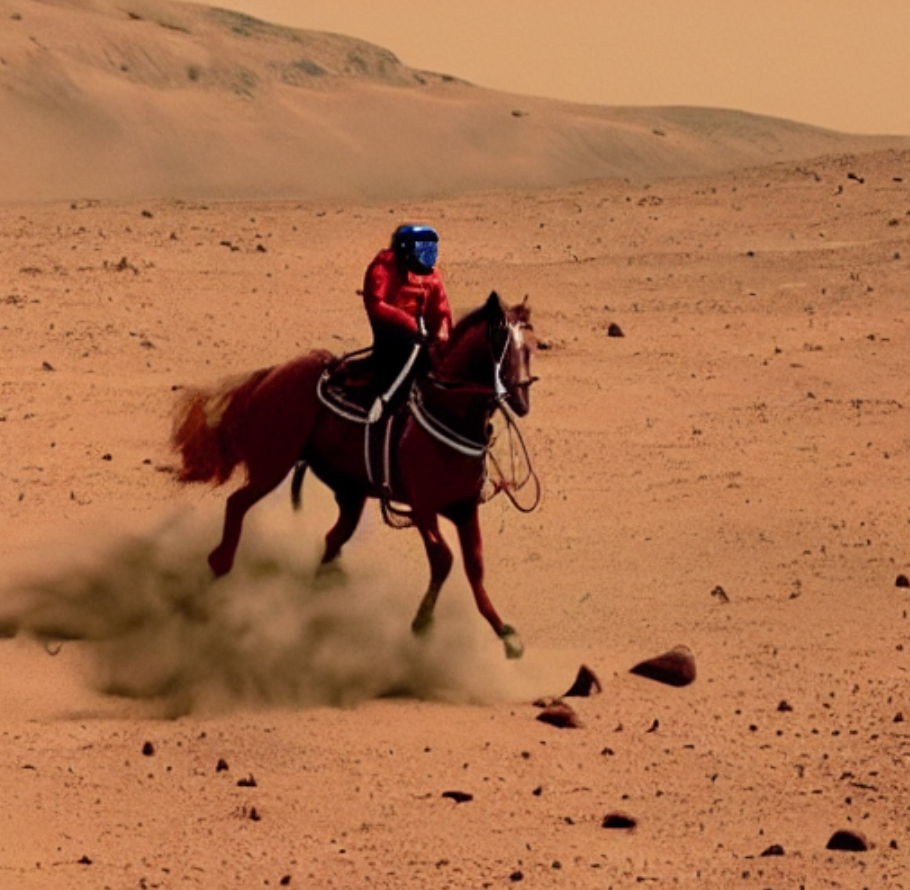

In [10]:
Image("/content/cloned-repo/astro1.png" , width=300)

Notice the horses legs in this image. <br>


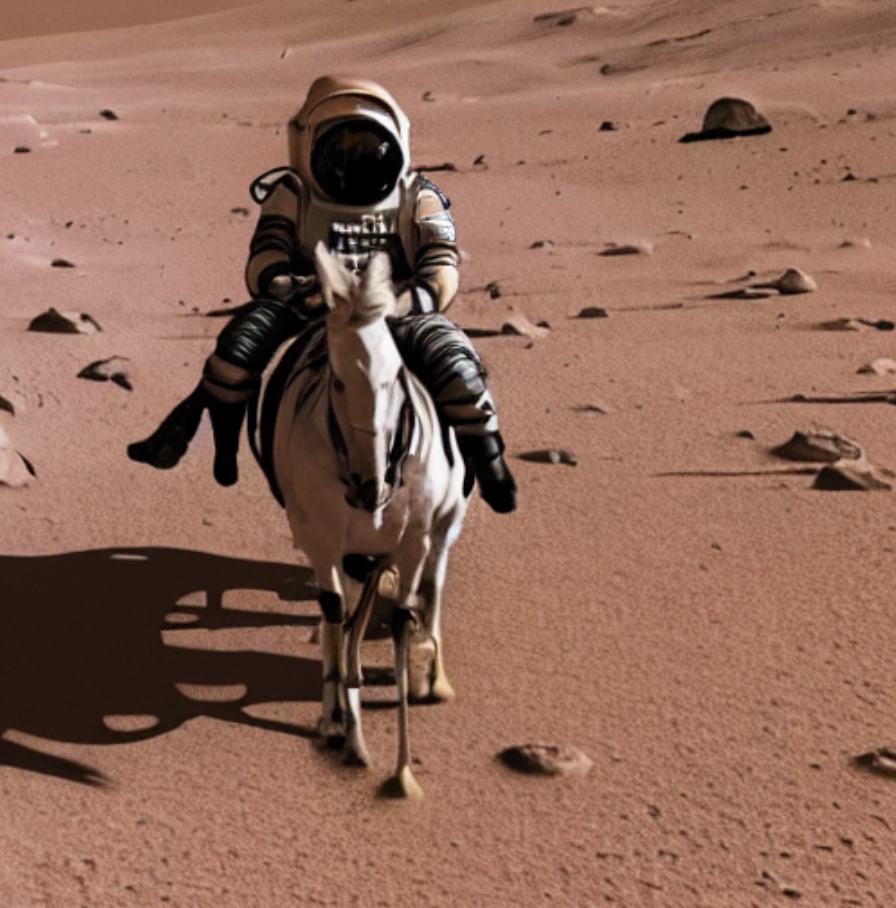

In [11]:
Image("/content/cloned-repo/astro7.png" , width=300)

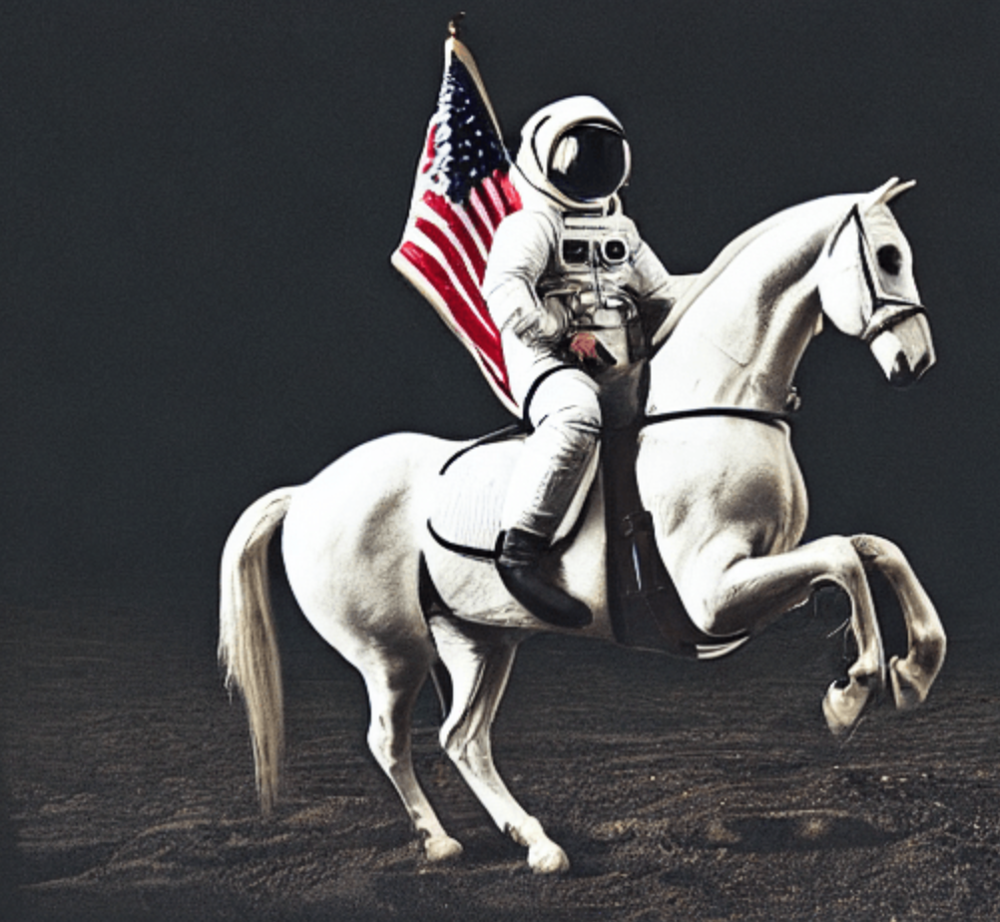

In [12]:
Image("/content/cloned-repo/astro2.png" , width=300)

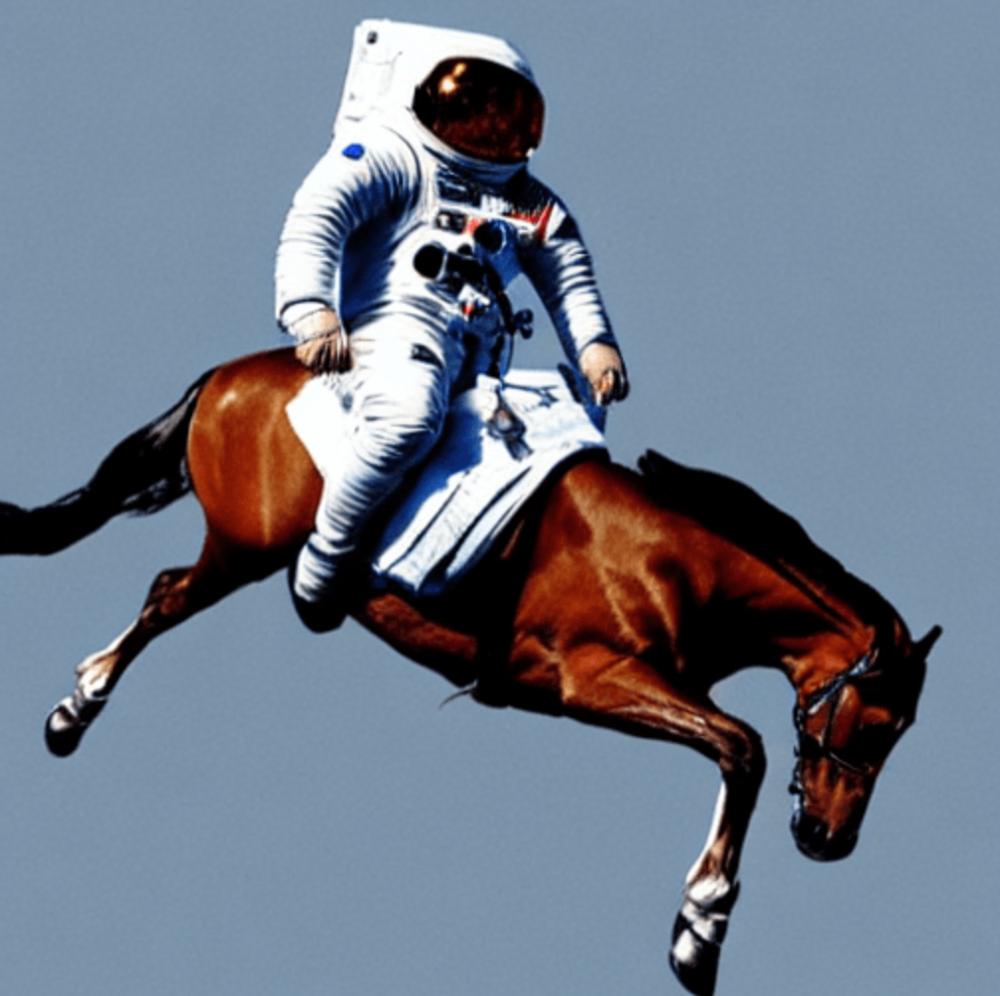

In [13]:
Image("/content/cloned-repo/astro3.png" , width=300)

Images generated with fewer timesteps

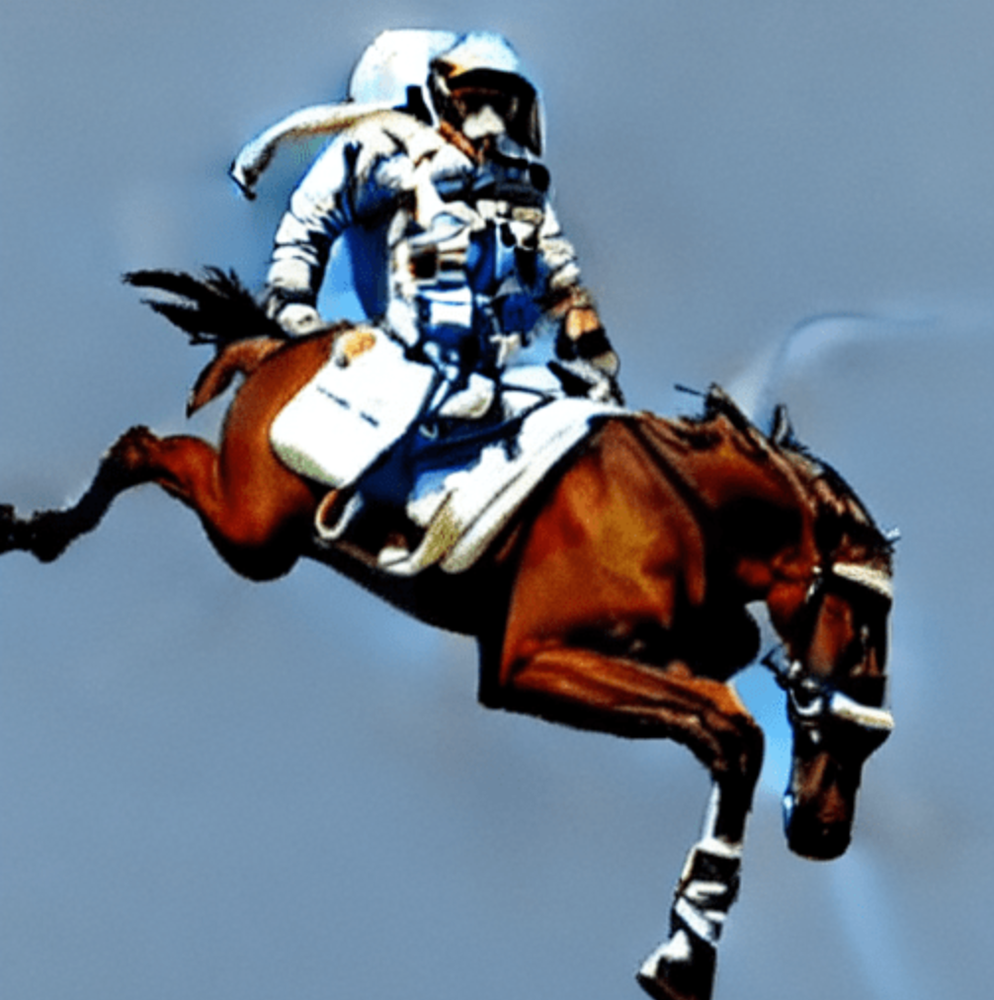

In [14]:
Image("/content/cloned-repo/astro4.png" , width=300)

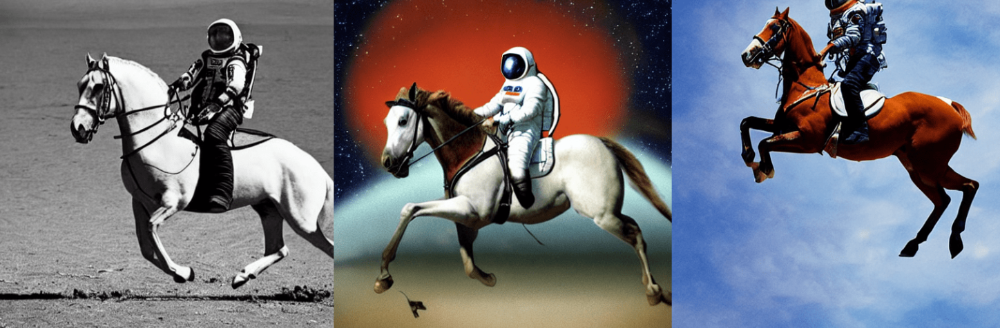

In [15]:
Image("/content/cloned-repo/astro5.png" , width=600)

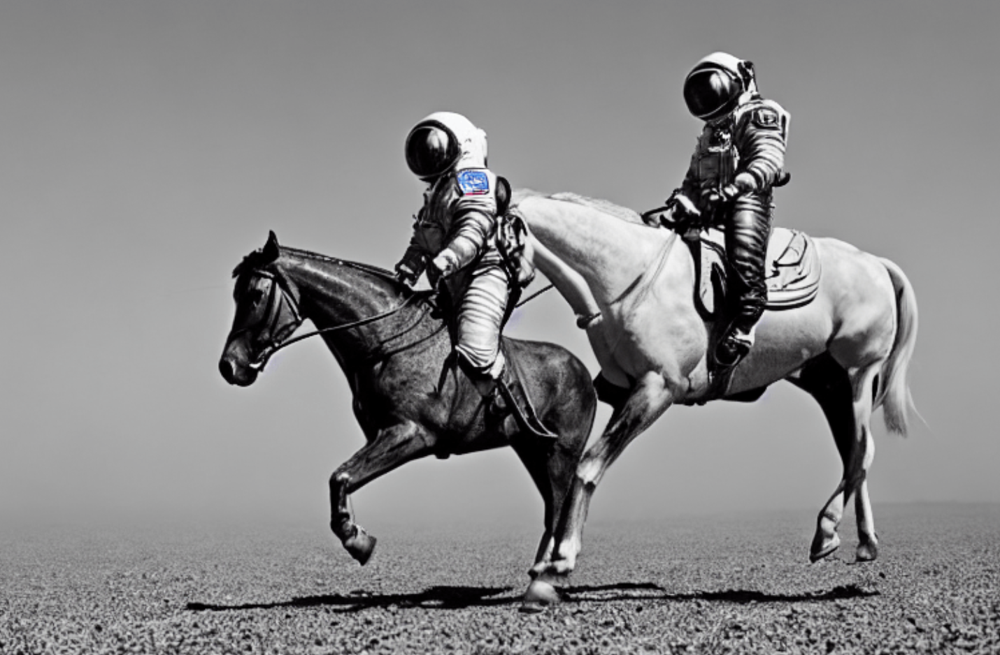

In [16]:
Image("/content/cloned-repo/astro6.png" , width=300)



---



---



# Prompt Engineering<br>
An interesting trend to have appeared since the release of the big three diffusion models (DALL-E 2, Imagen, and Midjourney) is the increased focus on something called “prompt engineering”.<br>

Prompt engineering is literally the “engineering” of prompts to achieve the desired result. <br><br>
**For example:** <br>
>many people have found that adding “in 4K” or “rendered in Unity” can enhance the realism of images generated by the big three (despite none of them generating in 4K resolution).

**Assignment**<br>
1. Change the number of inference steps
Run the code to generate a new image

2. Change the prompt. Try different wording with the prompt and observe the differences